# Inference with LLaVa, a multimodal LLM

LLaVa is an exciting new multimodal LLM which extends large language models like [LLaMa](https://huggingface.co/docs/transformers/model_doc/llama) with visual inputs.

For multimodal LLMs, one typically takes a pre-trained/fine-tuned LLM and additionally conditions it on image features. In case of LLaVa, the image features come from a pre-trained [CLIP](https://huggingface.co/docs/transformers/model_doc/clip)'s vision encoder. To match the dimension of the image features with those of the text features, one applies a projection module, which could be a simple linear projection (like the original LLaVa), or more sophisticated like a two-layer MLP (used in LLaVa 1.5).

One then trains the model to predict the next text token, given image features and text tokens.

![image/png](https://cdn-uploads.huggingface.co/production/uploads/62441d1d9fdefb55a0b7d12c/FPshq08TKYD0e-qwPLDVO.png)

* Transformers docs: https://huggingface.co/docs/transformers/main/en/model_doc/llava.
* Original LLaVa paper: https://arxiv.org/abs/2304.08485
* LLaVa 1.5 paper: https://arxiv.org/pdf/2310.03744.pdf
* [notebook](https://colab.research.google.com/drive/1qsl6cd2c8gGtEW1xV5io7S8NHh-Cp1TV?usp=sharing#scrollTo=6Bx8iu9jOssW) which inspired me to create this notebook.

## Set-up environment

Let's start by installing the necessary libraries. Here we install Accelerate and Bitsandbytes in order to load the model in Google Colab. This enables [4-bit inference](https://huggingface.co/blog/4bit-transformers-bitsandbytes) with clever quantization techniques, shrinking the size of the model considerably, while maintaining performance of the original size.

In [1]:
!pip install --upgrade -q accelerate bitsandbytes

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.1/315.1 kB 25.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.5/137.5 MB 16.9 MB/s eta 0:00:00


In [2]:
 !pip install haversine

We also update the Transformers version of Google Colab to use the main branch, as the model is brand new at the time of writing.

In [3]:
!pip install git+https://github.com/huggingface/transformers.git

  Cloning https://github.com/huggingface/transformers.git to /tmp/pip-req-build-k70d02na
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers.git /tmp/pip-req-build-k70d02na
  Resolved https://github.com/huggingface/transformers.git to commit 7ad784ae9da9b8ce61ba734199fb258d8d95460f
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for transformers: filename=transformers-4.45.0.dev0-py3-none-any.whl size=9479602 sha256=3aef8dc746f33ec960b55513b7ca771b662fadc736c12bb0167652232f7ee5c8
  Stored in directory: /tmp/pip-ephem-wheel-cache-7f96r5cb/wheels/e7/9c/5b/e1a9c8007c343041e61cc484433d512ea9274272e3fcbe7c16
Successfully built transformers
  Attempting uninstall: transformers
    Found existing installation: transformers 4.42.4
    Uninstalling transformers-4.42.4:
      Successfully uninstalled transformers-4.42.4


## Load model and processor

Next, we load a model and corresponding processor from the hub. We specify device_map="auto" in order to automatically place the model on the available GPUs/CPUs (see [this guide](https://huggingface.co/docs/accelerate/usage_guides/big_modeling) for details).

Regarding [quantization](https://huggingface.co/blog/4bit-transformers-bitsandbytes), refer to the blog post for all details.

In [4]:
from transformers import AutoProcessor, LlavaForConditionalGeneration
from transformers import BitsAndBytesConfig
import torch

quantization_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16
)


model_id = "llava-hf/llava-1.5-7b-hf"

processor = AutoProcessor.from_pretrained(model_id)
model = LlavaForConditionalGeneration.from_pretrained(model_id, quantization_config=quantization_config, device_map="auto")

preprocessor_config.json:   0%|          | 0.00/505 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.36k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/500k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.84M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/41.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/552 [00:00<?, ?B/s]

chat_template.json:   0%|          | 0.00/488 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/950 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/70.1k [00:00<?, ?B/s]

model-00001-of-00003.safetensors:   0%|          | 0.00/4.99G [00:00<?, ?B/s]

model-00002-of-00003.safetensors:   0%|          | 0.00/4.96G [00:00<?, ?B/s]

model-00003-of-00003.safetensors:   0%|          | 0.00/4.18G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

In [25]:
import os
import pandas as pd

# 1. Get the Current Directory
current_directory = os.getcwd()
# 2. Construct the Full Path to the CSV File
csv_file_path = os.path.join(current_directory,  'hotel_multimodal.csv')
# Read the CSV file
df_hotels = pd.read_csv(csv_file_path)
geocoded_hotels_path = os.path.join(current_directory, 'geocoded_hotels.csv')
# Read the CSV file
geocoded_hotels = pd.read_csv(geocoded_hotels_path)

In [26]:
import requests

def get_current_location():
    try:
        response = requests.get('https://ipinfo.io/json')
        data = response.json()

        location = data.get('loc', '')
        if location:
            latitude, longitude = map(float, location.split(','))
            return latitude, longitude
        else:
            return None, None
    except Exception as e:
        print(f"An error occurred: {e}")
        return None, None

latitude, longitude = get_current_location()
if latitude and longitude:
    print(f"Current location: Latitude = {latitude}, Longitude = {longitude}")
else:
    print("Could not retrieve the current location.")


Current location: Latitude = 1.2897, Longitude = 103.8501


In [27]:
from geopy.geocoders import Nominatim

def get_coordinates(location_name):
    """Fetches latitude and longitude coordinates for a given location name.

    Args:
        location_name (str): The name of the location (e.g., "Rome, Italy").

    Returns:
        tuple: A tuple containing the latitude and longitude (float values),
               or None if the location is not found.
    """

    geolocator = Nominatim(user_agent="coordinate_finder")
    location = geolocator.geocode(location_name)

    if location:
        return location.latitude, location.longitude
    else:
        return None  # Location not found


In [57]:
import pandas as pd
import numpy as np
from haversine import haversine  # Install haversine library: pip install haversine
def find_nerby(place=None):
    if place!=None:
        coordinates = get_coordinates(place)
        if coordinates:
            latitude, longitude = coordinates
            print(f"The coordinates of {place} are: Latitude: {latitude}, Longitude: {longitude}")
        else:
            print(f"Location not found: {place}")
    else:
        latitude, longitude = get_current_location()
        if latitude and longitude:
            print(f"Current location: Latitude = {latitude}, Longitude = {longitude}")
    # Load the geocoded_hotels DataFrame
    current_directory = os.getcwd()
    geocoded_hotels_path = os.path.join(current_directory, 'geocoded_hotels.csv')
    geocoded_hotels = pd.read_csv(geocoded_hotels_path)

    # Define input coordinates for the reference location
    reference_latitude = latitude
    reference_longitude = longitude

    # Haversine Distance Function
    def calculate_haversine_distance(lat1, lon1, lat2, lon2):
        """Calculates the Haversine distance between two points on the Earth's surface."""
        return haversine((lat1, lon1), (lat2, lon2))

    # Calculate distances to all other points in the DataFrame
    geocoded_hotels['distance_km'] = geocoded_hotels.apply(
        lambda row: calculate_haversine_distance(
            reference_latitude, reference_longitude, row['latitude'], row['longitude']
        ),
        axis=1
    )

    # Sort by distance and get the top 5 closest points
    closest_hotels = geocoded_hotels.sort_values(by='distance_km').head(5)

    # Display the results
    print("The 5 closest locations are:\n")
    print(closest_hotels)
    return closest_hotels

In [29]:
df_found=find_nerby()

Current location: Latitude = 1.2897, Longitude = 103.8501
The 5 closest locations are:

       hotel_id                       hotel_name  chain_id  latitude  \
16223     22297  Hotel Jen Puteri Harbour  Johor        -1   1.41677   
14496     19986          Legoland Malaysia Hotel        -1   1.42708   
19168     26291              Ramada Plaza Melaka        73   2.19968   
10800     14961              Philea Resort & Spa        -1   2.29799   
3820       5495         Putrajaya Marriott Hotel         2   2.96897   

       longitude              city   country   state county           suburb  \
16223  103.65650   Iskandar Puteri  Malaysia   Johor    NaN   Puteri Harbour   
14496  103.62954   Iskandar Puteri  Malaysia   Johor    NaN           Medini   
19168  102.25246  Bandaraya Melaka  Malaysia  Melaka    NaN              NaN   
10800  102.31135        Alor Gajah  Malaysia  Melaka    NaN              NaN   
3820   101.70622            Sepang  Malaysia     NaN    NaN  IOI Resort City   

In [30]:
# Converting df_found[["hotel_id"]].values to a list
hotel_ids = df_found["hotel_id"].values.tolist()

# Extracting rows from df_hotels where hotel_id is in the list hotel_ids
filtered_df = df_hotels[df_hotels['hotel_id'].isin(hotel_ids)]


# Ordering filtered_df by the order of hotel_ids
filtered_df['hotel_id'] = pd.Categorical(filtered_df['hotel_id'], categories=hotel_ids, ordered=True)
filtered_df = filtered_df.sort_values('hotel_id').reset_index(drop=True)

<ipython-input-30-3c988b8be9b7>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['hotel_id'] = pd.Categorical(filtered_df['hotel_id'], categories=hotel_ids, ordered=True)


<ipython-input-31-1ceada31dbbf>:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  hotel_images = grouped_df[filtered_df['hotel_id'] == hotel_id]
<ipython-input-31-1ceada31dbbf>:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  hotel_images = grouped_df[filtered_df['hotel_id'] == hotel_id]
<ipython-input-31-1ceada31dbbf>:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  hotel_images = grouped_df[filtered_df['hotel_id'] == hotel_id]


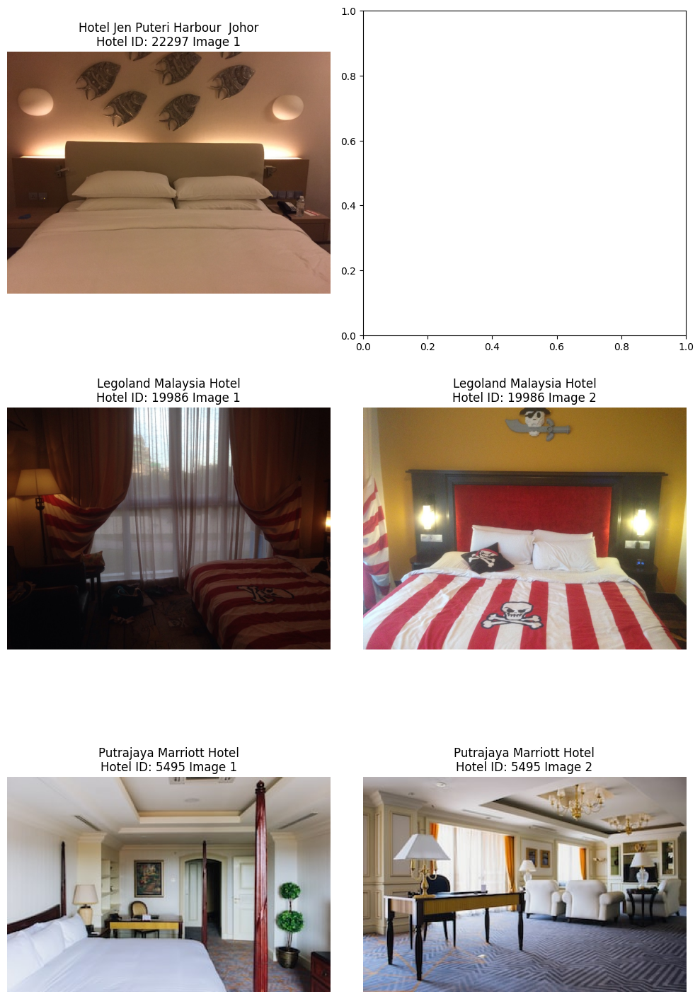

In [31]:
import pandas as pd
import requests
from PIL import Image, UnidentifiedImageError
from io import BytesIO
import matplotlib.pyplot as plt
import urllib3

# Suppress the InsecureRequestWarning
urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

# Assuming filtered_df is defined somewhere before this part of the code
# Group by hotel_id and take the first 2 image URLs for each hotel
grouped_df = filtered_df.groupby('hotel_id', observed=True).head(2)

# Download and display the images
unique_hotel_ids = grouped_df['hotel_id'].unique()

fig, axs = plt.subplots(len(unique_hotel_ids), 2, figsize=(10, 5 * len(unique_hotel_ids)))

for i, hotel_id in enumerate(unique_hotel_ids):
    hotel_images = grouped_df[filtered_df['hotel_id'] == hotel_id]
    hotel_name = hotel_images.iloc[0]['hotel_name']

    for j, image_url in enumerate(hotel_images['image_url']):
        try:
            response = requests.get(image_url, verify=False)
            response.raise_for_status()  # Check for request errors
            img = Image.open(BytesIO(response.content))
            axs[i, j].imshow(img)
            axs[i, j].axis('off')
            axs[i, j].set_title(f"{hotel_name}\nHotel ID: {hotel_id} Image {j+1}")
        except (requests.RequestException, UnidentifiedImageError):
            print(f"Skipping image at URL: {image_url}")
            axs[i, j].axis('off')  # Keep the axis off for empty slots

# Handle case when there's only one hotel to avoid index error
if len(unique_hotel_ids) == 1:
    axs = [axs]

plt.tight_layout()
plt.show()


## Prepare image and text for the model

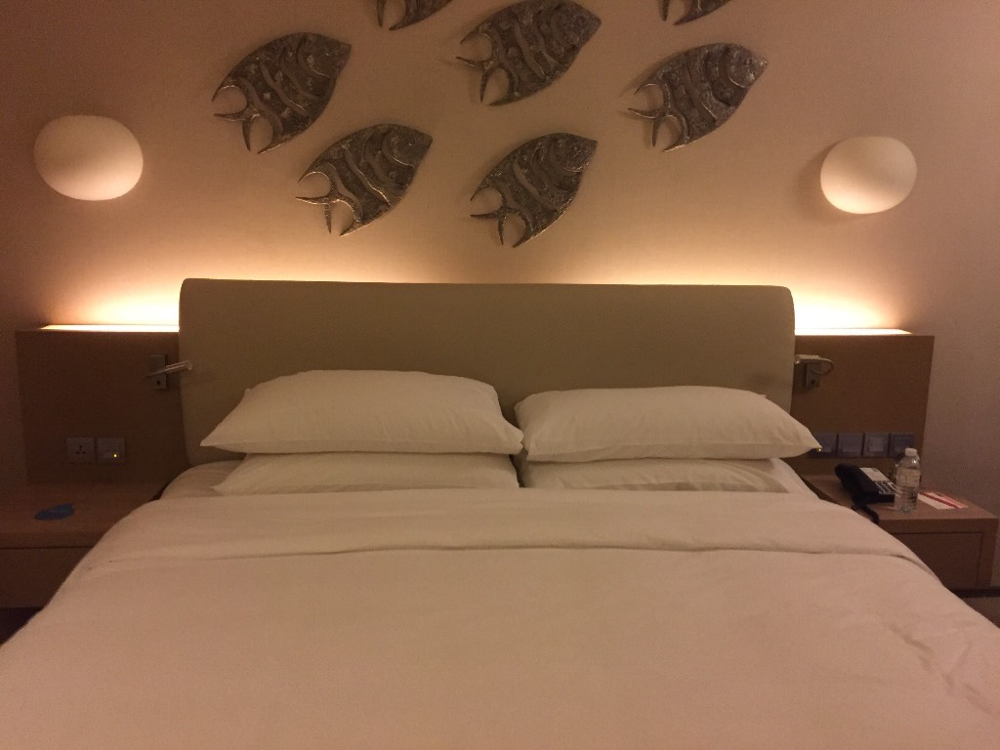

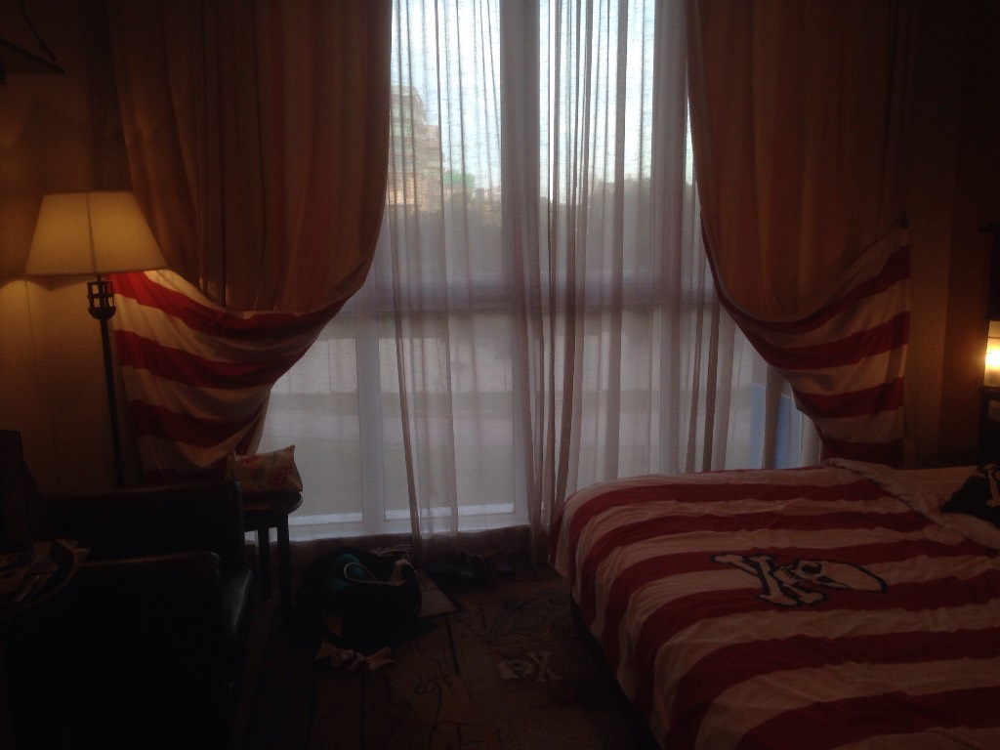

In [32]:
import requests
from PIL import Image, UnidentifiedImageError
from io import BytesIO
import urllib3

# Suppress the InsecureRequestWarning
urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

def fetch_image(url):
    try:
        response = requests.get(url, stream=True, verify=False)
        response.raise_for_status()  # Check for request errors
        return Image.open(BytesIO(response.content))
    except requests.RequestException as e:
        print(f"Request error: {e}")
        return None
    except UnidentifiedImageError:
        print(f"Unidentified image at URL: {url}")
        return None

image1 = fetch_image("https://traffickcam.com/images/2018/6/20170531_112358_3O8KU1.jpg")
image2 = fetch_image("https://traffickcam.com/images/2018/5/20170404_103446_MO9Q4N.jpg")

if image1:
    display(image1)
if image2:
    display(image2)


In the prompt, you can refer to images using the special \<image> token. To indicate which text comes from a human vs. the model, one uses USER and ASSISTANT respectively. The format looks as follows:

```bash
USER: <image>\n<prompt>\nASSISTANT:
```

In other words, you always need to end your prompt with `ASSISTANT:`. Here we will perform batched generation (i.e generating on several prompts).

In [33]:
prompts = [
    "USER: <image>\nAnalyze this image and describe in detail what it contains. Provide a summary of the main elements and activities shown in the image. Additionally, give me feedback on whether this place is worth visiting and any precautions or items I should consider bringing with me. Provide a comprehensive review.\nASSISTANT:",
    "USER: <image>\nPlease analyze this image and give a detailed description of its contents. Summarize the key features and any noticeable activities or points of interest.\nASSISTANT:",    ]

inputs = processor(prompts, images=[image1, image2], padding=True, return_tensors="pt").to("cuda")
for k, v in inputs.items():
    print(k, v.shape)


input_ids torch.Size([2, 75])
attention_mask torch.Size([2, 75])
pixel_values torch.Size([2, 3, 336, 336])


## Autoregressively generate completion

Finally, we simply let the model predict the next tokens given the images + prompt. Of course one can adjust all the [generation parameters](https://huggingface.co/docs/transformers/v4.35.2/en/main_classes/text_generation#transformers.GenerationMixin.generate). By default, greedy decoding is used.

In [34]:
output = model.generate(**inputs, max_new_tokens=100)
generated_text = processor.batch_decode(output, skip_special_tokens=True)
for text in generated_text:
  print(text.split("ASSISTANT:")[-1])

The `seen_tokens` attribute is deprecated and will be removed in v4.41. Use the `cache_position` model input instead.


 The image features a large, neatly made bed with white sheets and pillows. The bed is positioned in a room with a wall adorned with fish-shaped decorations, creating a unique and visually appealing atmosphere. The room appears to be well-lit, with a lamp on the wall and a light shining down on the bed.

Based on the image, the room seems to be a comfortable and inviting space. It is worth visiting,
 The image features a cozy bedroom with a large bed occupying most of the space. The bed is adorned with a red and white striped comforter, adding a touch of color to the room. A chair is placed near the bed, and a handbag can be seen on the floor, possibly belonging to the person who sleeps in the room.

A window is present in the room, allowing natural light to enter. The room also has a couch,


## Pipeline API

Alternatively, you can leverage the [pipeline](https://huggingface.co/docs/transformers/main_classes/pipelines) API which abstracts all of the logic above away for the user. We also provide the quantization config to make sure we leverage 4-bit inference.

In [35]:
from transformers import pipeline

pipe = pipeline("image-to-text", model=model_id, model_kwargs={"quantization_config": quantization_config})

`low_cpu_mem_usage` was None, now set to True since model is quantized.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

In [36]:
max_new_tokens = 200
prompt = "USER: <image>\nAnalyze this image and describe in detail what it contains. Provide a summary of the main elements and activities shown in the image. Additionally, give me feedback on whether this place is worth visiting and any precautions or items I should consider bringing with me. Provide a comprehensive review.\nASSISTANT:"

outputs = pipe(image1, prompt=prompt, generate_kwargs={"max_new_tokens": 200})

In [37]:
print(outputs[0]["generated_text"])

USER:  
Analyze this image and describe in detail what it contains. Provide a summary of the main elements and activities shown in the image. Additionally, give me feedback on whether this place is worth visiting and any precautions or items I should consider bringing with me. Provide a comprehensive review.
ASSISTANT: The image features a large, neatly made bed with white sheets and pillows. The bed is positioned in a room with a wall adorned with fish-shaped decorations, creating a unique and visually appealing atmosphere. The room appears to be well-lit, with a lamp on the wall and a light shining down on the bed.

Based on the image, the room seems to be a comfortable and inviting space. It is worth visiting, especially for those who appreciate the artistic and cozy ambiance created by the fish-shaped decorations and the well-lit room. As for precautions or items to bring, it would be advisable to bring a flashlight or a small light source, as the light shining down on the bed migh

###  Generation of Description of Pictures

In [38]:
import pandas as pd
import requests
from PIL import Image, UnidentifiedImageError
from io import BytesIO
import matplotlib.pyplot as plt
import urllib3
from transformers import pipeline
from transformers import BitsAndBytesConfig
import torch

# Suppress the InsecureRequestWarning
urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

# Define the quantization config and model ID
quantization_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16
)

model_id = "llava-hf/llava-1.5-7b-hf"

# Initialize the pipeline
pipe = pipeline("image-to-text", model=model_id, model_kwargs={"quantization_config": quantization_config})

# Assuming filtered_df is defined somewhere before this part of the code
# Group by hotel_id and take the first 2 image URLs for each hotel
grouped_df = filtered_df.groupby('hotel_id', observed=True).head(2)

# Create a new DataFrame for storing image descriptions
description_data = []

# Download and generate descriptions for the images
for index, row in grouped_df.iterrows():
    hotel_id = row['hotel_id']
    hotel_name = row['hotel_name']
    image_url = row['image_url']

    try:
        response = requests.get(image_url, verify=False)
        response.raise_for_status()  # Check for request errors
        img = Image.open(BytesIO(response.content))

        # Generate description for the image
        prompt = "USER: <image>\nAnalyze this image and describe in detail what it contains. Provide a summary of the main elements and activities shown in the image. Additionally, give me feedback on whether this place is worth visiting and any precautions or items I should consider bringing with me. Provide a comprehensive review.\nASSISTANT:"
        outputs = pipe(img, prompt=prompt, generate_kwargs={"max_new_tokens": 200})
        description = outputs[0]["generated_text"].split("\nASSISTANT:")[-1].strip()

        # Append data to the list
        description_data.append({
            'hotel_name': hotel_name,
            'hotel_id': hotel_id,
            'image': img,
            'description': description
        })
    except (requests.RequestException, UnidentifiedImageError):
        print(f"Skipping image at URL: {image_url}")

# Create a DataFrame from the description data
description_df = pd.DataFrame(description_data)



`low_cpu_mem_usage` was None, now set to True since model is quantized.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

In [39]:
description_df

,hotel_name,hotel_id,image,description
0,Hotel Jen Puteri Harbour Johor,22297,<PIL.JpegImagePlugin.JpegImageFile image mode=...,"The image features a large, neatly made bed wi..."
1,Legoland Malaysia Hotel,19986,<PIL.JpegImagePlugin.JpegImageFile image mode=...,The image features a cozy bedroom with a large...
2,Legoland Malaysia Hotel,19986,<PIL.JpegImagePlugin.JpegImageFile image mode=...,The image features a neatly made bed with a re...
3,Putrajaya Marriott Hotel,5495,<PIL.JpegImagePlugin.JpegImageFile image mode=...,The image features a large bedroom with a neat...
4,Putrajaya Marriott Hotel,5495,<PIL.JpegImagePlugin.JpegImageFile image mode=...,"The image depicts a large, well-lit room with ..."


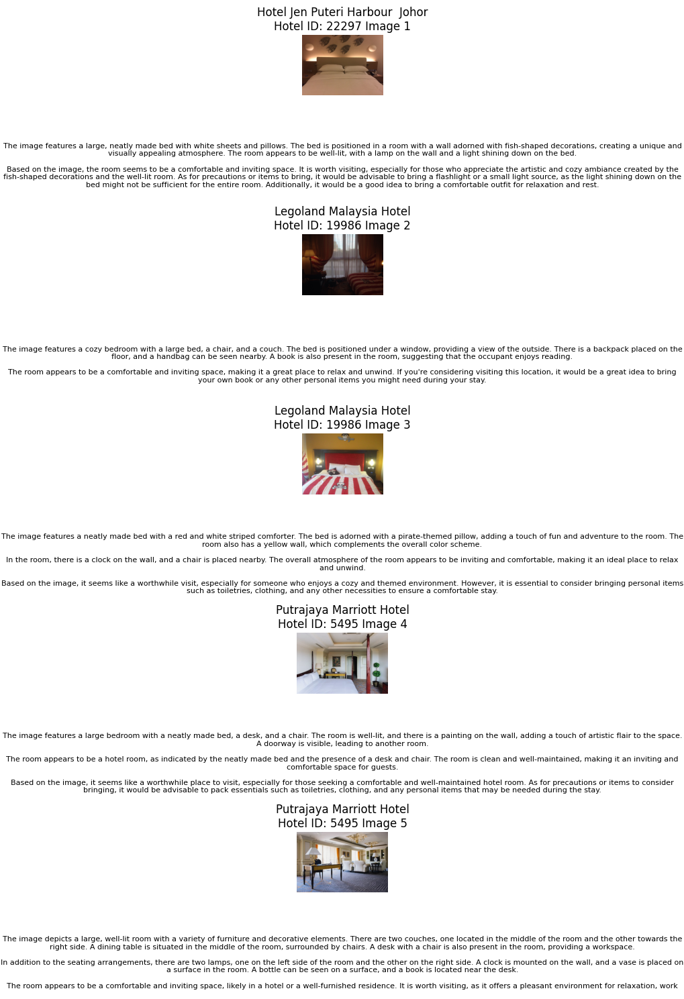

In [40]:
# Plot all pictures in a grid with descriptions
num_hotels = description_df['hotel_id'].nunique()
num_images = len(description_df)
num_rows = num_images * 2  # Each image row will be followed by a description row

fig, axs = plt.subplots(num_rows, 1, figsize=(10, 5 * num_hotels))

for i, (_, row) in enumerate(description_df.iterrows()):
    img = row['image']
    description = row['description']

    # Plot the image
    axs[2*i].imshow(img)
    axs[2*i].axis('off')
    axs[2*i].set_title(f"{row['hotel_name']}\nHotel ID: {row['hotel_id']} Image {i+1}")

    # Plot the description
    axs[2*i + 1].text(0.5, 0.5, description, ha='center', va='center', wrap=True, fontsize=8)
    axs[2*i + 1].axis('off')

plt.tight_layout()
plt.show()


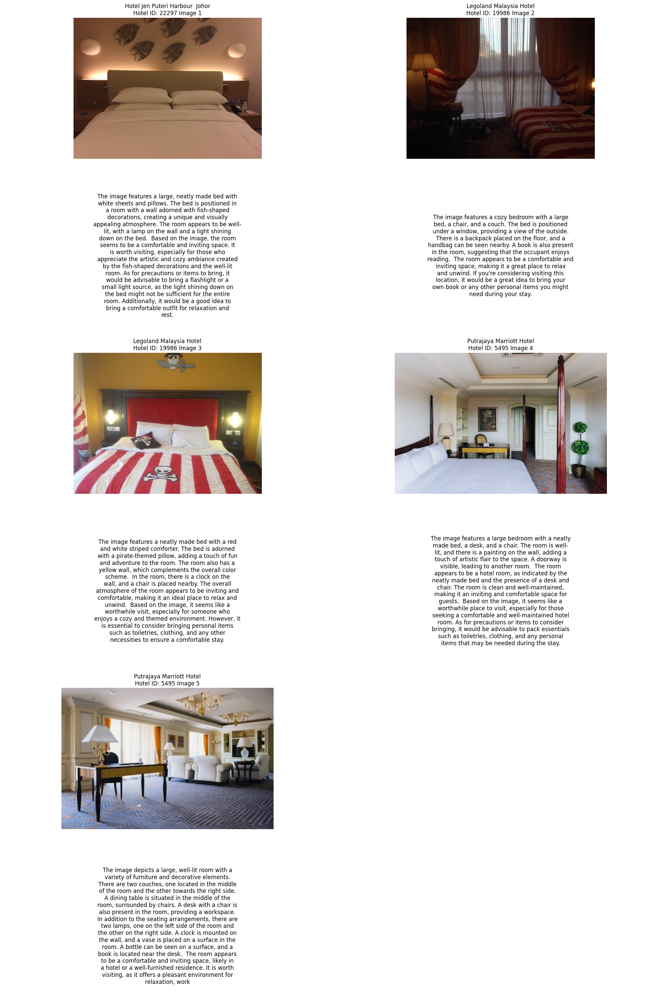

In [49]:
import matplotlib.pyplot as plt
import textwrap

# Calculate the number of rows needed
num_images = len(description_df)
num_rows = (num_images + 1) // 2  # Two images per row

fig, axs = plt.subplots(num_rows * 2, 2, figsize=(20, 10 * num_rows))

current_index = 0

for _, row in description_df.iterrows():
    img = row['image']
    description = row['description']

    if img is None:  # Skip if the image is missing
        continue

    row_idx = (current_index // 2) * 2
    col_idx = current_index % 2

    # Plot the image
    axs[row_idx, col_idx].imshow(img)
    axs[row_idx, col_idx].axis('off')
    axs[row_idx, col_idx].set_title(f"{row['hotel_name']}\nHotel ID: {row['hotel_id']} Image {current_index + 1}")

    # Wrap the description text
    wrapped_description = "\n".join(textwrap.wrap(description, width=50))

    # Plot the description
    axs[row_idx + 1, col_idx].text(0.5, 0.5, wrapped_description, ha='center', va='center', wrap=True, fontsize=12)
    axs[row_idx + 1, col_idx].axis('off')

    current_index += 1

# Hide any unused subplots
total_plots = (current_index + 1) // 2 * 2
for j in range(current_index, total_plots * 2):
    row_idx = (j // 2) * 2
    col_idx = j % 2
    if row_idx < num_rows * 2:
        axs[row_idx, col_idx].axis('off')
    if row_idx + 1 < num_rows * 2:
        axs[row_idx + 1, col_idx].axis('off')

plt.tight_layout()
plt.show()


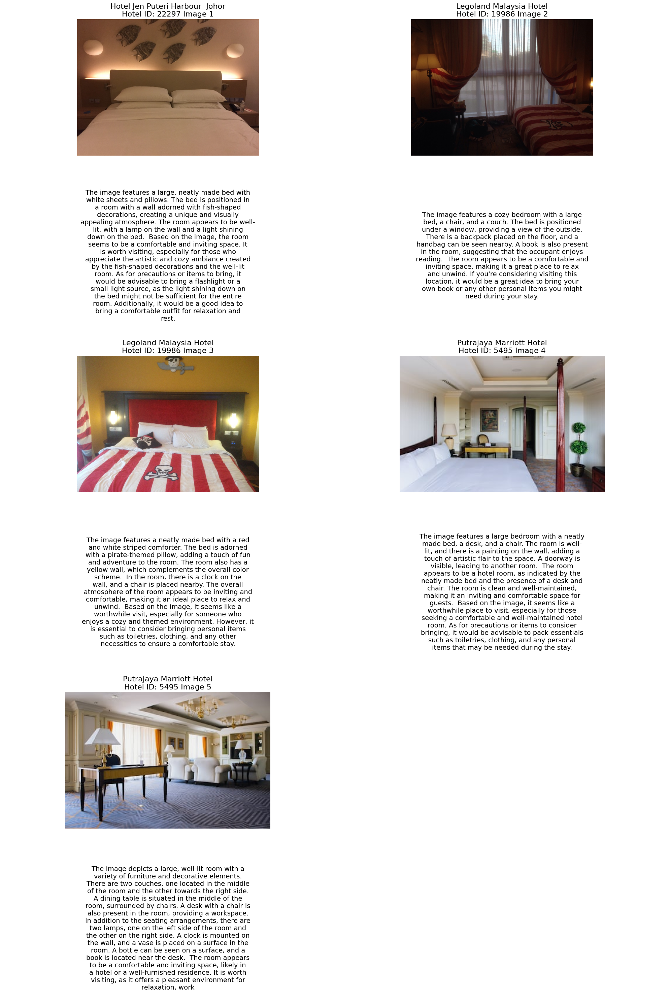

In [53]:
import matplotlib.pyplot as plt
import textwrap

# Calculate the number of rows needed
num_images = len(description_df)
num_rows = (num_images + 1) // 2  # Two images per row

fig, axs = plt.subplots(num_rows * 2, 2, figsize=(20, 10 * num_rows))

current_index = 0

for _, row in description_df.iterrows():
    img = row['image']
    description = row['description']

    if img is None:  # Skip if the image is missing
        continue

    row_idx = (current_index // 2) * 2
    col_idx = current_index % 2

    # Plot the image
    axs[row_idx, col_idx].imshow(img)
    axs[row_idx, col_idx].axis('off')
    axs[row_idx, col_idx].set_title(f"{row['hotel_name']}\nHotel ID: {row['hotel_id']} Image {current_index + 1}", fontsize=16)

    # Wrap the description text
    wrapped_description = "\n".join(textwrap.wrap(description, width=50))

    # Plot the description
    axs[row_idx + 1, col_idx].text(0.5, 0.5, wrapped_description, ha='center', va='center', wrap=True, fontsize=14)
    axs[row_idx + 1, col_idx].axis('off')

    current_index += 1

# Hide any unused subplots
total_plots = (current_index + 1) // 2 * 2
for j in range(current_index, total_plots * 2):
    row_idx = (j // 2) * 2
    col_idx = j % 2
    if row_idx < num_rows * 2:
        axs[row_idx, col_idx].axis('off')
    if row_idx + 1 < num_rows * 2:
        axs[row_idx + 1, col_idx].axis('off')

plt.tight_layout()
plt.show()


In [59]:

import pandas as pd
import numpy as np
from haversine import haversine  # Install haversine library: pip install haversine
def find_nearby(place=None):
    if place!=None:
        coordinates = get_coordinates(place)
        if coordinates:
            latitude, longitude = coordinates
            print(f"The coordinates of {place} are: Latitude: {latitude}, Longitude: {longitude}")
        else:
            print(f"Location not found: {place}")
    else:
        latitude, longitude = get_current_location()
        if latitude and longitude:
            print(f"Current location: Latitude = {latitude}, Longitude = {longitude}")
    # Load the geocoded_hotels DataFrame
    current_directory = os.getcwd()
    geocoded_hotels_path = os.path.join(current_directory, 'geocoded_hotels.csv')
    geocoded_hotels = pd.read_csv(geocoded_hotels_path)

    # Define input coordinates for the reference location
    reference_latitude = latitude
    reference_longitude = longitude

    # Haversine Distance Function
    def calculate_haversine_distance(lat1, lon1, lat2, lon2):
        """Calculates the Haversine distance between two points on the Earth's surface."""
        return haversine((lat1, lon1), (lat2, lon2))

    # Calculate distances to all other points in the DataFrame
    geocoded_hotels['distance_km'] = geocoded_hotels.apply(
        lambda row: calculate_haversine_distance(
            reference_latitude, reference_longitude, row['latitude'], row['longitude']
        ),
        axis=1
    )

    # Sort by distance and get the top 5 closest points
    closest_hotels = geocoded_hotels.sort_values(by='distance_km').head(5)

    # Display the results
    print("The 5 closest locations are:\n")
    print(closest_hotels)
    return closest_hotels


In [68]:
def search_hotel(place=None):
    import os
    import pandas as pd
    import requests
    from PIL import Image, UnidentifiedImageError
    from io import BytesIO
    import urllib3
    from transformers import pipeline
    from transformers import BitsAndBytesConfig
    import torch

    # Suppress the InsecureRequestWarning
    urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

    # 1. Get the Current Directory
    current_directory = os.getcwd()
    # 2. Construct the Full Path to the CSV File
    csv_file_path = os.path.join(current_directory, 'hotel_multimodal.csv')
    # Read the CSV file
    df_hotels = pd.read_csv(csv_file_path)
    geocoded_hotels_path = os.path.join(current_directory, 'geocoded_hotels.csv')
    # Read the CSV file
    geocoded_hotels = pd.read_csv(geocoded_hotels_path)

    # Assuming find_nearby function is defined elsewhere
    df_found = find_nearby(place)

    # Converting df_found[["hotel_id"]].values to a list
    hotel_ids = df_found["hotel_id"].values.tolist()

    # Extracting rows from df_hotels where hotel_id is in the list hotel_ids
    filtered_df = df_hotels[df_hotels['hotel_id'].isin(hotel_ids)]

    # Ordering filtered_df by the order of hotel_ids
    filtered_df['hotel_id'] = pd.Categorical(filtered_df['hotel_id'], categories=hotel_ids, ordered=True)
    filtered_df = filtered_df.sort_values('hotel_id').reset_index(drop=True)

    # Define the quantization config and model ID
    quantization_config = BitsAndBytesConfig(
        load_in_4bit=True,
        bnb_4bit_compute_dtype=torch.float16
    )

    model_id = "llava-hf/llava-1.5-7b-hf"

    # Initialize the pipeline
    pipe = pipeline("image-to-text", model=model_id, model_kwargs={"quantization_config": quantization_config})

    # Group by hotel_id and take the first 2 image URLs for each hotel
    grouped_df = filtered_df.groupby('hotel_id', observed=True).head(2)

    # Create a new DataFrame for storing image descriptions
    description_data = []

    # Download and generate descriptions for the images
    for index, row in grouped_df.iterrows():
        hotel_id = row['hotel_id']
        hotel_name = row['hotel_name']
        image_url = row['image_url']

        try:
            response = requests.get(image_url, verify=False)
            response.raise_for_status()  # Check for request errors
            img = Image.open(BytesIO(response.content))

            # Generate description for the image
            prompt = "USER: <image>\nAnalyze this image and describe in detail what it contains. Provide a summary of the main elements and activities shown in the image. Additionally, give me feedback on whether this place is worth visiting and any precautions or items I should consider bringing with me. Provide a comprehensive review.\nASSISTANT:"
            outputs = pipe(img, prompt=prompt, generate_kwargs={"max_new_tokens": 200})
            description = outputs[0]["generated_text"].split("\nASSISTANT:")[-1].strip()

            # Append data to the list
            description_data.append({
                'hotel_name': hotel_name,
                'hotel_id': hotel_id,
                'image': img,
                'description': description
            })
        except (requests.RequestException, UnidentifiedImageError):
            print(f"Skipping image at URL: {image_url}")

    # Create a DataFrame from the description data
    description_df = pd.DataFrame(description_data)
    return description_df


In [66]:
import os
import pandas as pd
import requests
from PIL import Image, UnidentifiedImageError
from io import BytesIO
import matplotlib.pyplot as plt
import urllib3
from transformers import pipeline
from transformers import BitsAndBytesConfig
import torch
import textwrap


def show_hotels(place=None):
    description_df = search_hotel(place)

    # Calculate the number of rows needed
    num_images = len(description_df)
    num_rows = (num_images + 1) // 2  # Two images per row

    fig, axs = plt.subplots(num_rows * 2, 2, figsize=(20, 10 * num_rows))

    current_index = 0

    for _, row in description_df.iterrows():
        img = row['image']
        description = row['description']

        if img is None:  # Skip if the image is missing
            continue

        row_idx = (current_index // 2) * 2
        col_idx = current_index % 2

        # Plot the image
        axs[row_idx, col_idx].imshow(img)
        axs[row_idx, col_idx].axis('off')
        axs[row_idx, col_idx].set_title(f"{row['hotel_name']}\nHotel ID: {row['hotel_id']} Image {current_index + 1}", fontsize=16)

        # Wrap the description text
        wrapped_description = "\n".join(textwrap.wrap(description, width=50))

        # Plot the description
        axs[row_idx + 1, col_idx].text(0.5, 0.5, wrapped_description, ha='center', va='center', wrap=True, fontsize=14)
        axs[row_idx + 1, col_idx].axis('off')

        current_index += 1

    # Hide any unused subplots
    total_plots = (current_index + 1) // 2 * 2
    for j in range(current_index, total_plots * 2):
        row_idx = (j // 2) * 2
        col_idx = j % 2
        if row_idx < num_rows * 2:
            axs[row_idx, col_idx].axis('off')
        if row_idx + 1 < num_rows * 2:
            axs[row_idx + 1, col_idx].axis('off')

    plt.tight_layout()
    plt.show()


Current location: Latitude = 1.2897, Longitude = 103.8501
The 5 closest locations are:

       hotel_id                       hotel_name  chain_id  latitude  \
16223     22297  Hotel Jen Puteri Harbour  Johor        -1   1.41677   
14496     19986          Legoland Malaysia Hotel        -1   1.42708   
19168     26291              Ramada Plaza Melaka        73   2.19968   
10800     14961              Philea Resort & Spa        -1   2.29799   
3820       5495         Putrajaya Marriott Hotel         2   2.96897   

       longitude              city   country   state county           suburb  \
16223  103.65650   Iskandar Puteri  Malaysia   Johor    NaN   Puteri Harbour   
14496  103.62954   Iskandar Puteri  Malaysia   Johor    NaN           Medini   
19168  102.25246  Bandaraya Melaka  Malaysia  Melaka    NaN              NaN   
10800  102.31135        Alor Gajah  Malaysia  Melaka    NaN              NaN   
3820   101.70622            Sepang  Malaysia     NaN    NaN  IOI Resort City   

<ipython-input-65-90d1cac91660>:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['hotel_id'] = pd.Categorical(filtered_df['hotel_id'], categories=hotel_ids, ordered=True)
`low_cpu_mem_usage` was None, now set to True since model is quantized.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Skipping image at URL: https://i.travelapi.com/hotels/7000000/6020000/6013700/6013630/85ff988e_b.jpg
Skipping image at URL: https://i.travelapi.com/hotels/6000000/5680000/5680000/5679922/6adcd715_b.jpg


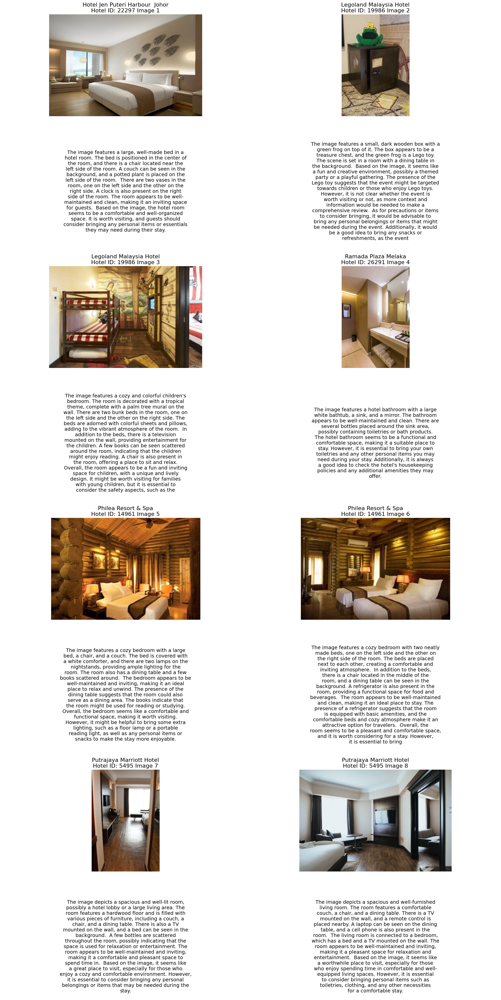

In [67]:
 show_hotels()